# Autres embeddings et clustering

In [1]:
import scanpy as sc
import pandas as pd

adata = sc.read_h5ad('processed_data/integrated3.h5ad')

/Users/luandechery/Documents/faculdade/python/stage/.conda/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [2]:
adata

AnnData object with n_obs × n_vars = 8652 × 5000
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', '_scvi_batch', '_scvi_labels', 'leiden'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Sample_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'umap'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts', 'scvi_normalized'
    obsp: 'connectivities', 'distances'

In [3]:
sc.pp.normalize_total(adata, target_sum = 1e4)
sc.pp.log1p(adata)
adata.raw = adata

adata.X seems to be already log-transformed.


In [4]:
df = pd.DataFrame(adata.X.toarray(),
                 index=adata.obs_names,   # cellules
                 columns=adata.var_names)  # gènes

# PCA

### un patient

In [21]:
# Pour récupérer les données d'un seul patient, par exemple 'patient_14' :
patient_name = 'patient_14'
adata_patient = adata[adata.obs['Sample'] == patient_name]
df_patient = pd.DataFrame(
    adata_patient.X.toarray(),
    index=adata_patient.obs_names,
    columns=adata_patient.var_names
)

In [22]:
df_patient

,LINC00115,NOC2L,HES4,ISG15,AGRN,TNFRSF4,ACAP3,PUSL1,MRPL20,ATAD3A,...,MT-ATP6,MT-CO3,MT-ND3,MT-ND4L,MT-ND4,MT-ND5,MT-ND6,MT-CYB,AC011043.1,AC240274.1
AAACCCACAACTGAAA,1.392993,0.000000,1.392993,1.392993,1.392993,0.0,0.0,1.392993,2.018692,0.000000,...,3.324933,3.335985,3.514534,3.185491,3.605645,3.364188,2.612936,3.425679,0.0,0.0
AAACGAATCCCTCGAT,0.000000,0.000000,1.502206,1.111003,0.000000,0.0,0.0,0.000000,1.502206,0.000000,...,3.352656,3.440790,3.451856,2.771283,3.407522,3.158467,2.627239,3.342636,0.0,0.0
AAAGTCCCACTATCGA,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,1.995522,0.000000,...,3.239166,3.379679,3.446241,2.747098,3.356481,3.016639,2.487240,3.350261,0.0,0.0
AACAAAGCAATTGCCA,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,3.738350,3.826854,3.822516,3.367015,3.803774,3.567479,3.207590,3.743351,0.0,0.0
AACAACCAGACCAGAC,0.000000,1.640161,1.261505,0.890633,1.640161,0.0,0.0,0.000000,1.925090,0.890633,...,3.092426,3.244100,3.139841,2.458511,3.217235,2.856797,2.799980,3.118476,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTGTGTCATGT,0.000000,0.000000,0.000000,2.586300,2.157088,0.0,0.0,0.000000,1.606469,0.000000,...,2.371660,2.586300,2.545863,2.281286,2.652440,2.880294,0.000000,2.281286,0.0,0.0
TTTGATCCAGCGACCT,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,3.698106,3.737170,3.737170,3.187092,3.757020,3.569169,3.060936,3.590227,0.0,0.0
TTTGGAGAGGATGGCT,0.000000,0.000000,0.000000,0.000000,2.277756,0.0,0.0,0.000000,0.000000,0.000000,...,3.488392,3.686192,3.548594,2.933678,3.614335,3.435556,2.277756,3.571930,0.0,0.0
TTTGGAGCATACCAGT,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,3.602726,3.557852,3.659666,2.339432,3.602726,2.920130,2.339432,3.632430,0.0,0.0


In [23]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_patient = scaler.fit_transform(df_patient)

In [24]:
df_patient

array([[ 5.2469044 , -0.5571347 ,  3.688004  , ...,  0.4418696 ,
        -0.12391774, -0.24974331],
       [-0.13335715, -0.5571347 ,  3.9952872 , ...,  0.30330965,
        -0.12391774, -0.24974331],
       [-0.13335715, -0.5571347 , -0.23135065, ...,  0.3160316 ,
        -0.12391774, -0.24974331],
       ...,
       [-0.13335715, -0.5571347 , -0.23135065, ...,  0.6858941 ,
        -0.12391774, -0.24974331],
       [-0.13335715, -0.5571347 , -0.23135065, ...,  0.78684026,
        -0.12391774, -0.24974331],
       [-0.13335715, -0.5571347 , -0.23135065, ..., -0.09749682,
        -0.12391774, -0.24974331]], shape=(2401, 5000), dtype=float32)

In [25]:
df_patient = df_patient.astype('float64')
df_patient

array([[ 5.24690437, -0.55713469,  3.68800402, ...,  0.44186959,
        -0.12391774, -0.24974331],
       [-0.13335715, -0.55713469,  3.99528718, ...,  0.30330965,
        -0.12391774, -0.24974331],
       [-0.13335715, -0.55713469, -0.23135065, ...,  0.31603161,
        -0.12391774, -0.24974331],
       ...,
       [-0.13335715, -0.55713469, -0.23135065, ...,  0.68589407,
        -0.12391774, -0.24974331],
       [-0.13335715, -0.55713469, -0.23135065, ...,  0.78684026,
        -0.12391774, -0.24974331],
       [-0.13335715, -0.55713469, -0.23135065, ..., -0.09749682,
        -0.12391774, -0.24974331]], shape=(2401, 5000))

In [ ]:
from sklearn.mixture import GaussianMixture

gmm_patient1 = GaussianMixture(n_components=4)
gmm_patient1.fit(df_patient)

,n_components,4
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,10
,init_params,'kmeans'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [27]:
labels = gmm_patient1.predict(df_patient)

In [28]:
from sklearn.decomposition import PCA

pca = PCA(n_components=7)

data_pca = pca.fit_transform(df_patient)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import itertools
import matplotlib.patches as mpatches

def plot_pca(df_patient_pca, labels, title="PCA avec clustering", size=18):

    X = np.array(df_patient_pca)
    n_components = X.shape[1]

    unique_labels = np.unique(labels)
    label_to_int = {lab: i for i, lab in enumerate(unique_labels)}
    labels_int = np.array([label_to_int[lab] for lab in labels])
    
    pairs = list(itertools.combinations(range(n_components), 2))
    
    n_plots = len(pairs)
    n_cols = min(3, n_plots)  # max 3 colonnes
    n_rows = int(np.ceil(n_plots / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
    axes = np.array(axes).reshape(-1)  # Flatten pour accès facile
    
    colors = plt.cm.viridis(np.linspace(0, 1, len(unique_labels)))
    
    for idx, (i, j) in enumerate(pairs):
        ax = axes[idx]
        sc = ax.scatter(X[:, i], X[:, j], c=labels_int, cmap='viridis', s=size)
        ax.set_xlabel(f'PCA Component {i+1}')
        ax.set_ylabel(f'PCA Component {j+1}')
    
    for ax in axes[len(pairs):]:
        ax.axis("off")
    
    # Légende avec les vrais labels
    handles = [mpatches.Patch(color=colors[i], label=str(lab)) for i, lab in enumerate(unique_labels)]
    fig.legend(handles=handles, title="Clusters", loc="center right", bbox_to_anchor=(1, 0.8))
    
    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()


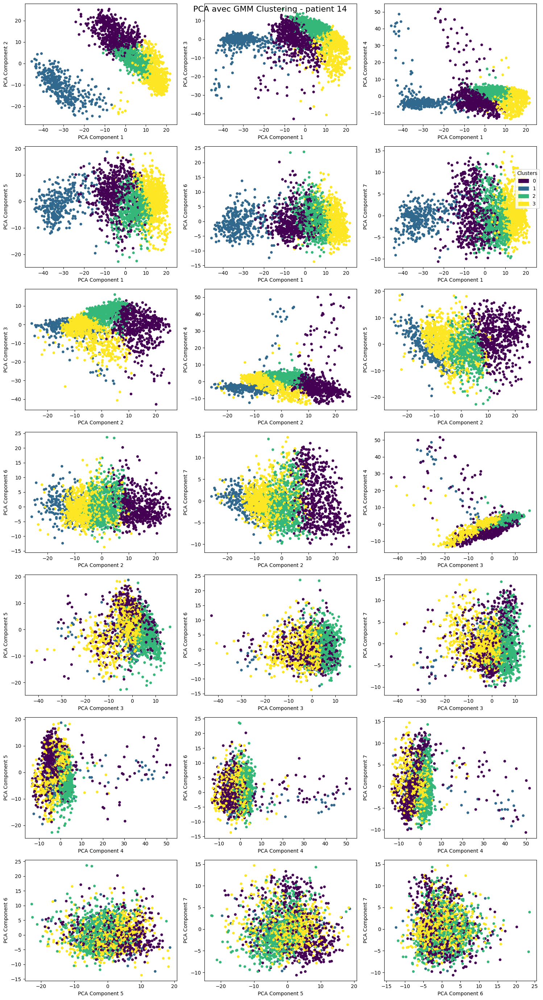

In [ ]:
plot_pca(data_pca, labels, title="PCA avec GMM Clustering - patient 14")


### tout les patients

In [33]:
df = scaler.fit_transform(df)
df = df.astype('float64')
df

array([[-0.20299239,  1.32342744,  4.37427616, ...,  0.17579055,
        -0.20813891, -0.33842477],
       [-0.20299239,  0.46903321,  1.79874957, ..., -1.75617421,
        -0.20813891,  2.23418236],
       [-0.20299239,  0.9450708 , -0.33255321, ...,  0.16973214,
        -0.20813891, -0.33842477],
       ...,
       [-0.20299239, -0.84166825, -0.33255321, ...,  1.05106664,
        -0.20813891, -0.33842477],
       [-0.20299239,  0.97828203, -0.33255321, ...,  0.58435225,
        -0.20813891, -0.33842477],
       [-0.20299239,  0.66881955, -0.33255321, ...,  0.88101244,
        -0.20813891, -0.33842477]], shape=(8652, 5000))

In [34]:
gmm = GaussianMixture(n_components=15)
gmm.fit(df)
labels = gmm.predict(df)

In [117]:
pca = PCA(n_components=7)

data_pca = pca.fit_transform(df)

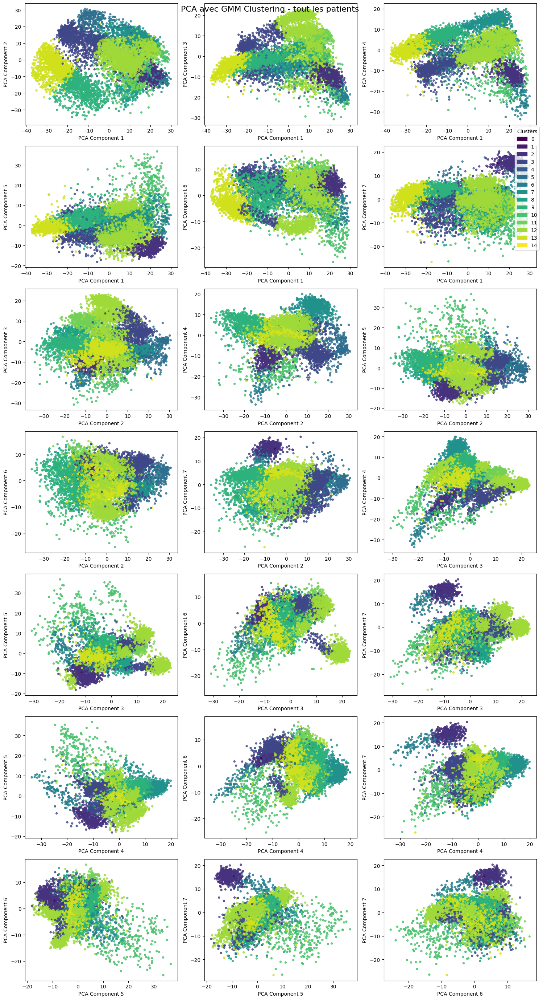

In [ ]:
plot_pca(data_pca, labels, title="PCA avec GMM Clustering - tout les patients", size=13)


In [130]:
patient_labels = adata.obs['Sample'].values
patient_labels.shape

(8652,)

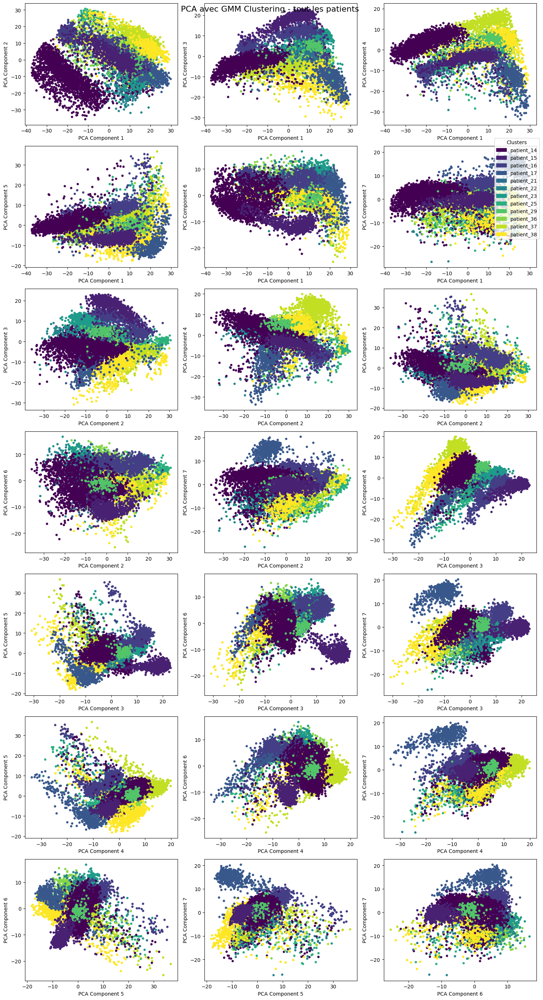

In [ ]:
plot_pca(data_pca, patient_labels, title="PCA avec GMM Clustering - tout les patients", size=13)


# Spectral clustering avec MST

sur un seul patient

In [ ]:
from sklearn.cluster import SpectralClustering

spectral = SpectralClustering(n_clusters=4, 
                              affinity='nearest_neighbors',  
                              n_neighbors=10,               
                              random_state=42)
labels = spectral.fit_predict(df_patient)


In [45]:
from scipy.spatial.distance import pdist, squareform
from scipy.sparse.csgraph import minimum_spanning_tree

# Matrice de distances
dist_matrix = squareform(pdist(df_patient, metric='euclidean'))

# MST
mst = minimum_spanning_tree(dist_matrix)

# Conversion en dense pour visualiser
mst_dense = mst.toarray()

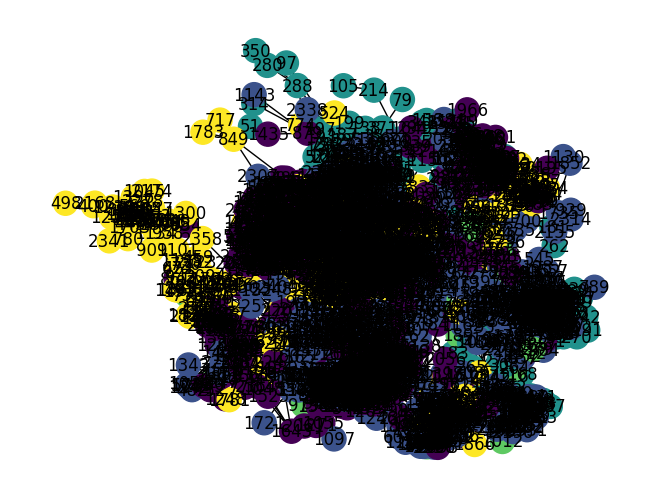

In [38]:
import networkx as nx
import matplotlib.pyplot as plt

G = nx.from_numpy_array(mst_dense)
nx.draw(G, node_color=labels, with_labels=True)
plt.show()

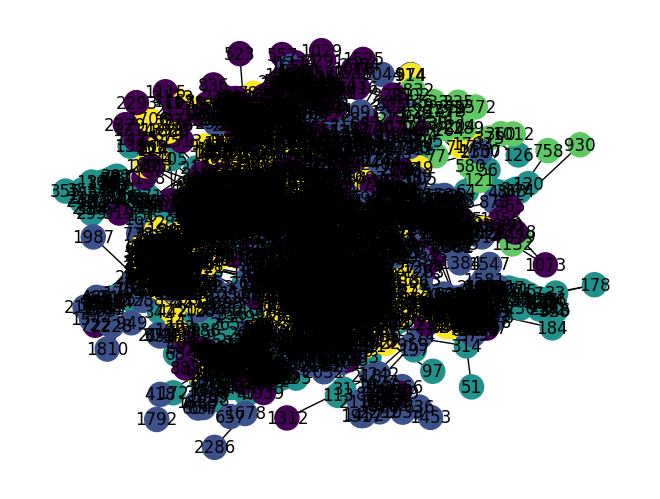

In [39]:
import networkx as nx
import matplotlib.pyplot as plt

G = nx.from_numpy_array(mst_dense)
nx.draw(G, node_color=labels, with_labels=True)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from itertools import combinations
from scipy.spatial.distance import pdist, squareform
from scipy.sparse.csgraph import minimum_spanning_tree
import numpy as np

def plot_mst(X, labels=None):
    
    n_components = X.shape[1]
    comb = list(combinations(range(n_components), 2))
    
    # Calcul du MST sur l'espace original
    dist_matrix = squareform(pdist(X))
    mst = minimum_spanning_tree(dist_matrix).toarray()
    
    n_plots = len(comb)
    n_cols = min(3, n_plots)
    n_rows = int(np.ceil(n_plots / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
    axes = axes.flatten()
    
    for idx, (i, j) in enumerate(comb):
        ax = axes[idx]
        
        if labels is not None:
            sc = ax.scatter(X[:, i], X[:, j], c=labels, cmap='tab10', s=50)
        else:
            sc = ax.scatter(X[:, i], X[:, j], color='blue', s=50)
        
        # Tracer MST
        for p, q in zip(*mst.nonzero()):
            ax.plot([X[p,i], X[q,i]], [X[p,j], X[q,j]], color='gray', alpha=0.5)
        
        ax.set_xlabel(f"Comp {i+1}")
        ax.set_ylabel(f"Comp {j+1}")
        ax.set_title(f"Comp {i+1} vs Comp {j+1}")
    
    for k in range(idx+1, len(axes)):
        fig.delaxes(axes[k])

    
    plt.tight_layout()
    plt.show()


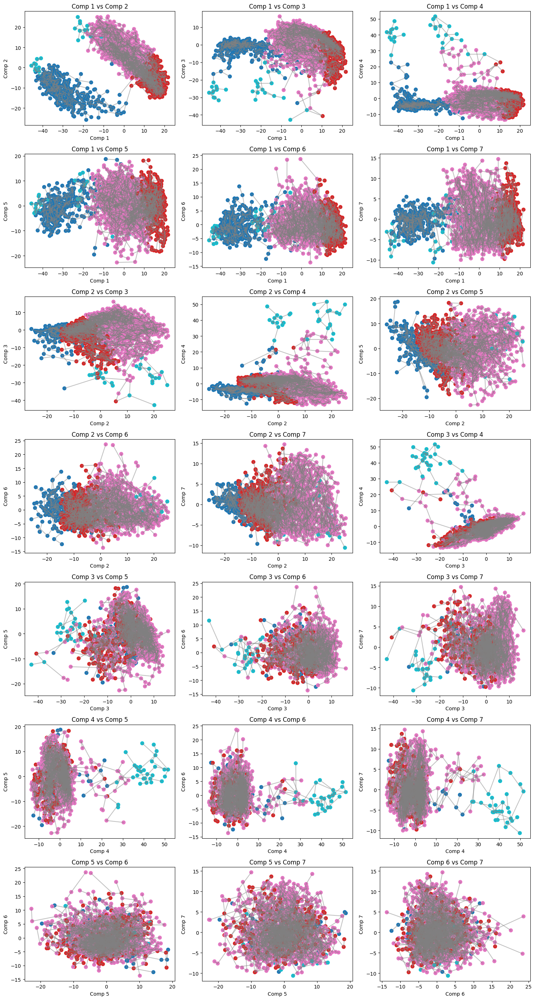

In [ ]:
pca = PCA(n_components=7)
X_pca = pca.fit_transform(df_patient)

plot_mst(X_pca, labels=labels)


In [48]:
#spectral embedding
from sklearn.manifold import SpectralEmbedding

spectral = SpectralEmbedding(n_components=7, affinity='nearest_neighbors', n_neighbors=10)
X_spectral = spectral.fit_transform(df_patient)


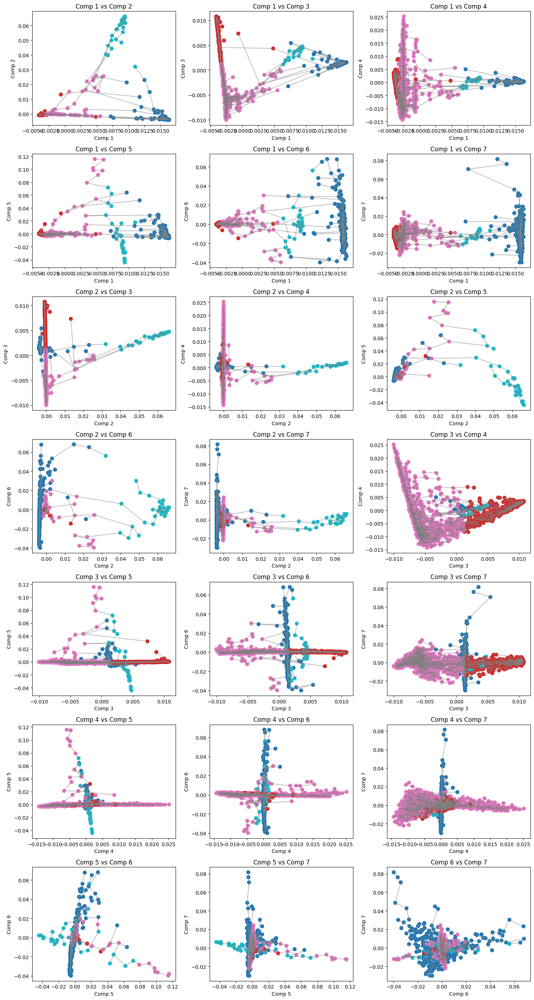

In [ ]:
plot_mst(X_spectral, labels=labels)